In [1]:
from torchvision.datasets.folder import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
from statistics import mean
import impaintingLib as imp

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def random_cutout(imgs, min_cut=15,max_cut=45):
    n, c, h, w = imgs.shape
    w1 = np.random.randint(0, w, n)
    h1 = np.random.randint(0, h, n)
    
    w2 = np.random.randint(0, w, n)
    h2 = np.random.randint(0, h, n)
    
    cutouts = torch.empty((n, c, h, w), dtype=imgs.dtype, device=imgs.device)
    for i, (img, w11, h11, w22, h22) in enumerate(zip(imgs, w1, h1, w2, h2)):
        cut_img = img.clone()
        cut_img[:, h11:h11 + h11, w11:w11 + w11] = 0
        cut_img[:, h22:h22 + h11, w22:w22 + w22] = 0
        cutouts[i] = cut_img
    return cutouts

def plot_img(x):
    img_grid = make_grid(x[:16])
    plt.figure(figsize=(20,15))
    plt.imshow(img_grid.cpu().permute(1, 2, 0))
    plt.axis('off')
    plt.show()

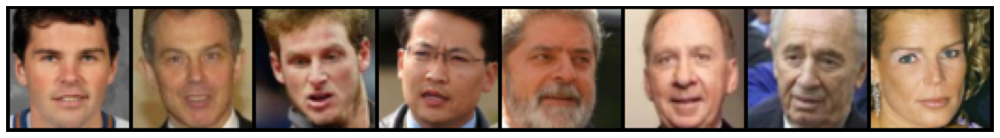

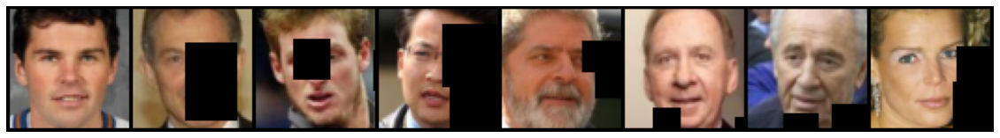

In [2]:
seed = 0
factorResize = 0 # 0 2 4
shuffle = seed == 0
if not shuffle :
    torch.manual_seed(seed)

trainloader, testloader = imp.data.getFaces(shuffle=shuffle,resize=factorResize)
x, _ = next(iter(trainloader))
x_co = random_cutout(x)
plot_img(x[:8])
plot_img(x_co[:8])

### Méthode pour ségmenter l'input

In [3]:
import impaintingLib as imp
classif = imp.loss.getTrainedModel()

def simplifyChannels(x):
    x = np.where(x == 3, 0, x) 
    x = np.where(x == 4, 3, x) 
    x = np.where(x == 5, 3, x) 
    x = np.where(x == 6, 4, x) 
    x = np.where(x == 7, 4, x) 
    x = np.where(x == 8, 5, x) 
    x = np.where(x == 9, 5, x) 
    x = np.where(x == 10 , 6, x) 
    x = np.where(x == 11, 7, x) 
    x = np.where(x == 12, 7, x)  
    x = np.where(x > 12, 0, x) 
    return (x / 9) + 0.1

def npToTensor(x):
    c,w,h = x.shape
    x = torch.from_numpy(x).to(device)
    x = torch.reshape(x, (c,1,w,h))
    return x.float()

def get_segmentation(x, segmenter=classif, scale_factor=4, simplify=True):
    n,c,w,h = x.shape
    with torch.no_grad():
        if scale_factor > 0 :
            x = torch.nn.functional.interpolate(x, scale_factor=scale_factor)
        x = transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))(x)
        y = classif(x)
        if scale_factor > 0 :
            y = torch.nn.functional.avg_pool2d(y, scale_factor)
    if simplify: 
        y = imp.loss.generate_label_plain(y,w)
        y = simplifyChannels(y)
        y = npToTensor(y)
        return y
    else: 
        return y

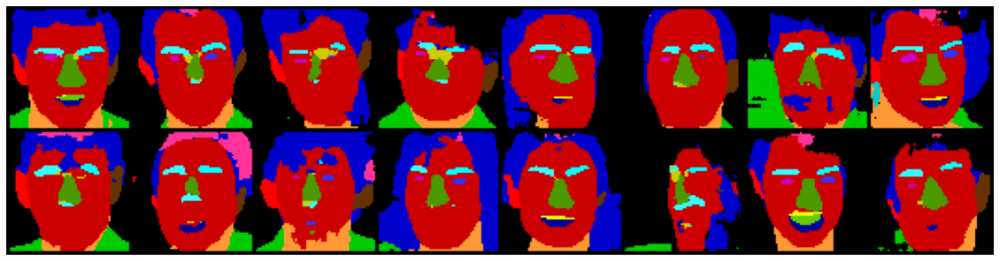

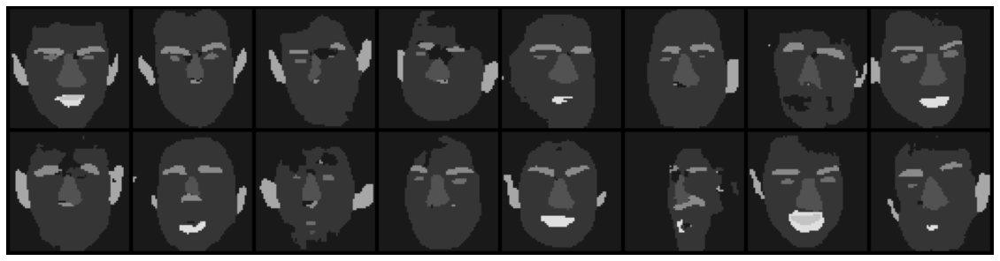

In [4]:
seg = get_segmentation(x.cuda(), simplify=False, scale_factor=4-factorResize)
n,c,w,h = x.shape
classifDisplay = imp.loss.generate_label(seg,w).to(device)
plot_img(classifDisplay)
seg = get_segmentation(x.cuda(), simplify=True, scale_factor=4-factorResize)
plot_img(seg)

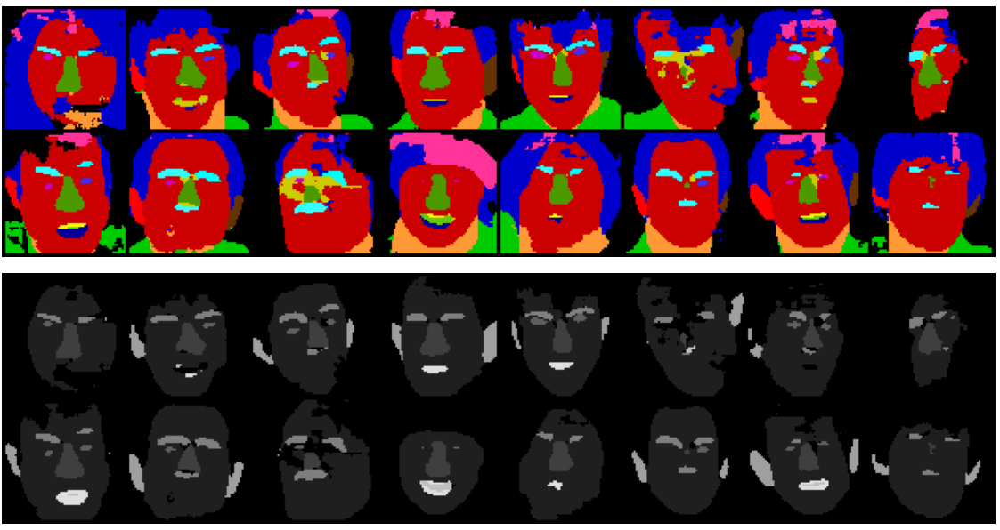
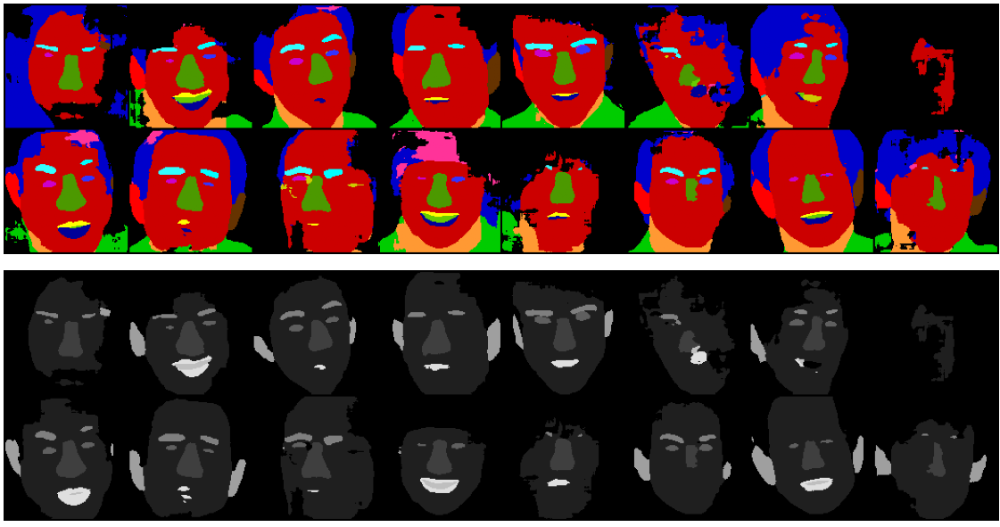
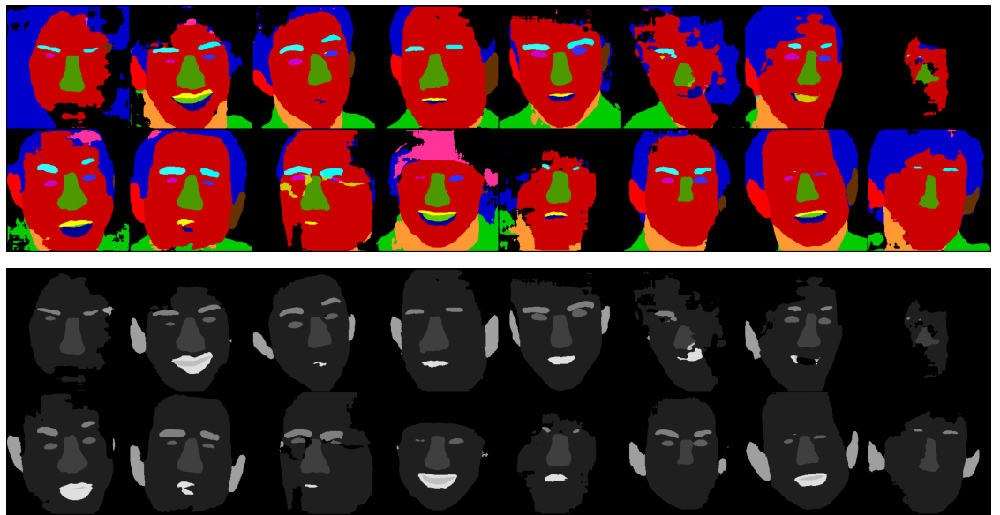

In [5]:
import torchvision.models as models

def gram_matrix(input):
    a, b, c, d = input.size()   # a=batch size(=1)
                                # b=number of feature maps
                                # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d) 
    G = torch.mm(features, features.t())  # compute the gram product
    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

class LossNetwork(torch.nn.Module):
    def __init__(self):
        super(LossNetwork, self).__init__()
        vgg_model = models.vgg16(pretrained=True).to(device).eval()
        self.vgg_layers = vgg_model.features
        self.layer_name_mapping = {
            '3': "relu1_2",
            '8': "relu2_2",
            '15': "relu3_3",
            '22': "relu4_3"
        }
    
    def forward(self, x):
        features = []
        for name, module in self.vgg_layers._modules.items():
            x = module(x)
            if name in self.layer_name_mapping:
                features.append(x)
        return features
    

loss_network = LossNetwork()

def perceptual_loss(x, y):
    mse = torch.nn.MSELoss()
    x_feats = loss_network(x)
    with torch.no_grad():
        y_feats = loss_network(y)
    #content loss:
    loss = mse(x_feats[2], y_feats[2].detach())
    #style loss:
    for feats, target_feats in zip(x_feats, y_feats):
        loss += mse(gram_matrix(feats), gram_matrix(target_feats.detach()))
    return loss

In [6]:
def train_inpainting_segmented(net, optimizer, loader, scale_factor=4, epochs=5, min_cut=15,max_cut=45, simplify_seg=True, show_images=True):
    criterion = torch.nn.L1Loss()
    for epoch in range(epochs):
        running_loss = []
        t = tqdm(loader)
        for x, _ in t:
            x = x.to(device)
            segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
            x_co = random_cutout(x, min_cut, max_cut)
            x_input = torch.cat((x_co, segmented),dim=1)
            outputs = net(x_input)
            loss = criterion(outputs, x) + perceptual_loss(outputs, x)
            running_loss.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            t.set_description(f'training loss: {mean(running_loss)}, epoch: {epoch}/{epochs}')
        if show_images:
            plot_img(x[:8])
            plot_img(x_co[:8])
            if simplify_seg:
                plot_img(segmented[:8])
            else:
                classifDisplay = imp.loss.generate_label(segmented,w).to(device)
                plot_img(classifDisplay[:8])
            plot_img(torch.clip(outputs[:8], 0, 1))
            
def test_results_sample(net, testloader, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4):
    with torch.no_grad():
        x, _ = next(iter(testloader))
        x = x.to(device)
        segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
        x_co = random_cutout(x, min_cut, max_cut)
        x_input = torch.cat((x_co, segmented),dim=1)
        outputs = net(x_input)
        plot_img(x[:8])
        plot_img(x_co[:8])
        if simplify_seg:
            plot_img(segmented[:8])
        else:
            segmented = transforms.Resize((256,256))(segmented)
            classifDisplay = imp.loss.generate_label(segmented,w).to(device)
            plot_img(classifDisplay[:8])
        plot_img(torch.clip(outputs[:8], 0, 1))

### Train avec noir et blanc

In [ ]:
model = imp.model.UNet(4, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)

model.load_state_dict(torch.load("./modelSave/david/partial4channel_high"))
model.eval()

train_inpainting_segmented(model, optimizer, trainloader, scale_factor=4-factorResize, simplify_seg=True, epochs=7, min_cut=4, max_cut=60)

torch.save(model.state_dict(), "./modelSave/david/partial4channel_high")

### Test avec noir et blanc

In [ ]:
test_results_sample(model, testloader, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4-factorResize)

### Train tous les channels

  0%|          | 0/373 [00:00<?, ?it/s]

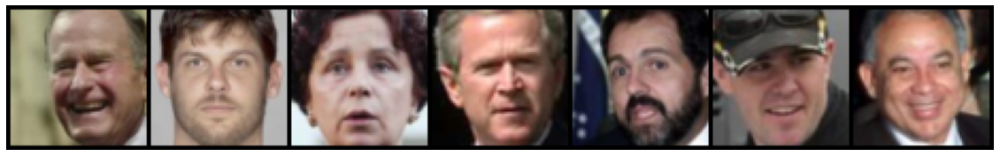

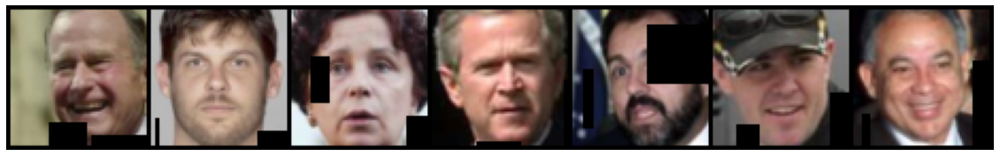

torch.Size([7, 19, 64, 64])


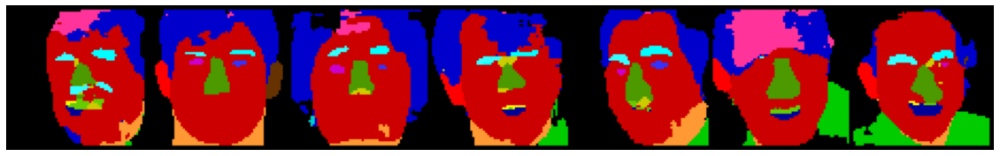

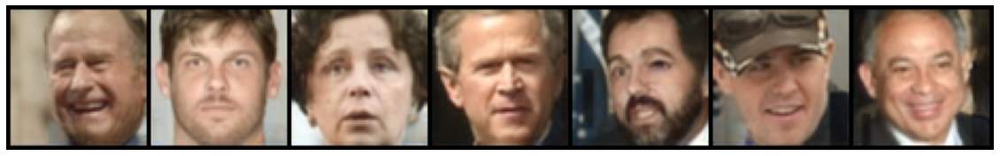

  0%|          | 0/373 [00:00<?, ?it/s]

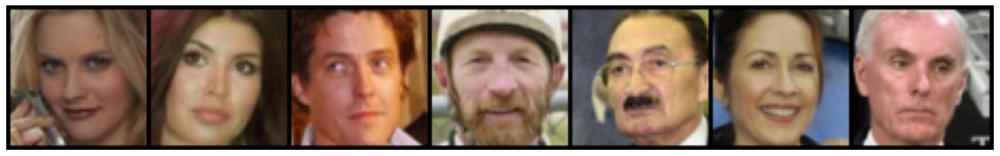

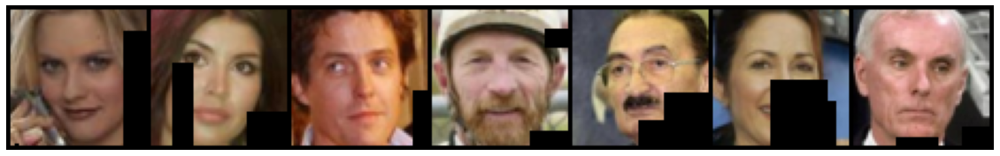

torch.Size([7, 19, 64, 64])


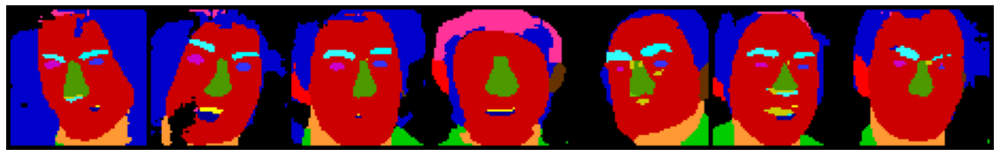

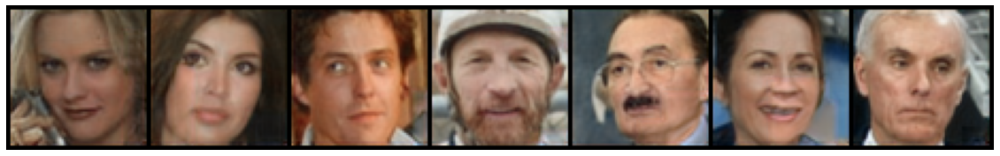

  0%|          | 0/373 [00:00<?, ?it/s]

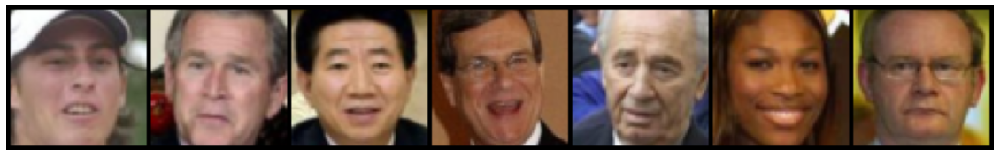

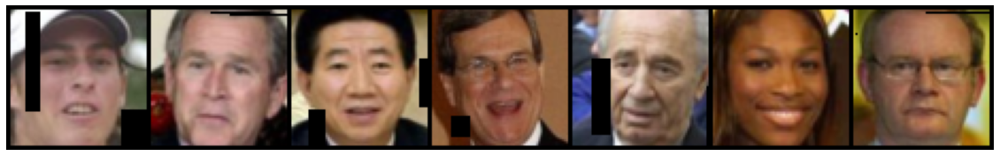

torch.Size([7, 19, 64, 64])


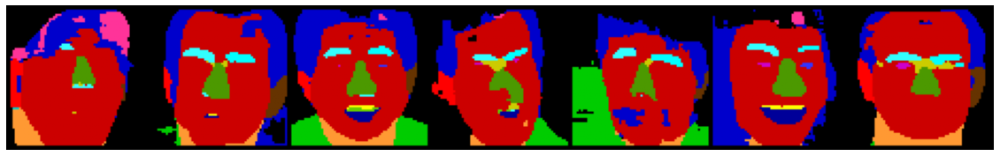

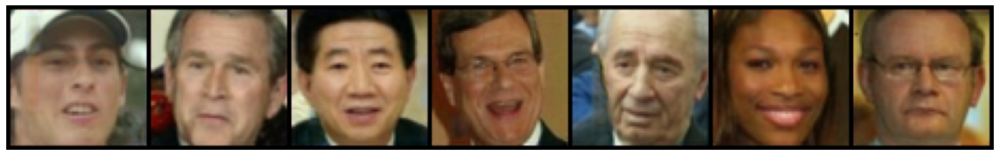

  0%|          | 0/373 [00:00<?, ?it/s]

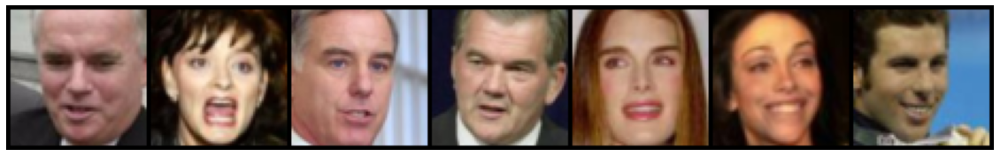

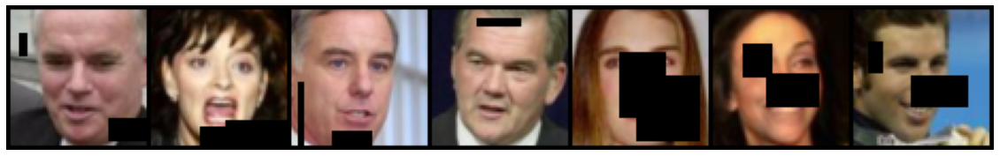

torch.Size([7, 19, 64, 64])


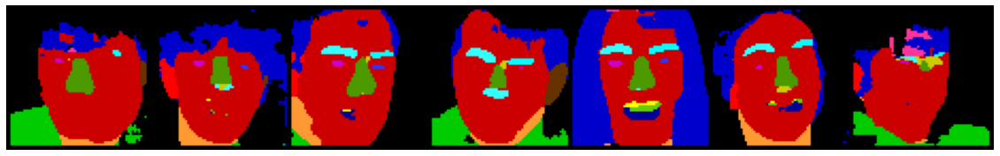

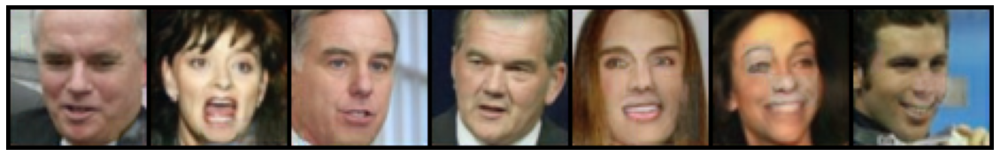

  0%|          | 0/373 [00:00<?, ?it/s]

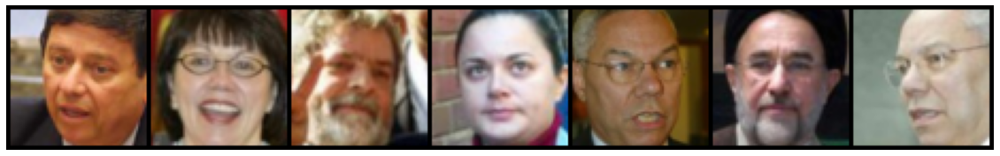

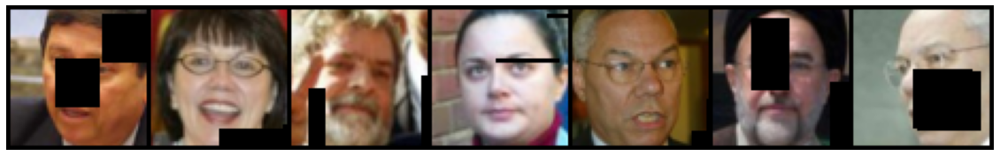

torch.Size([7, 19, 64, 64])


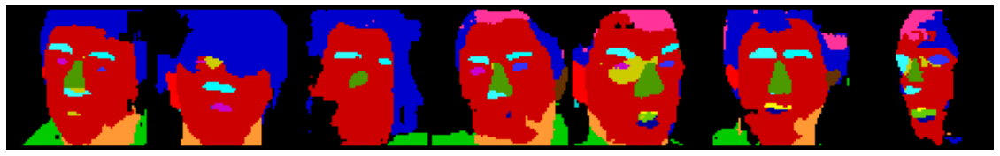

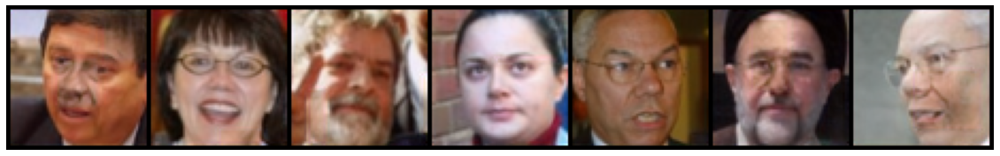

  0%|          | 0/373 [00:00<?, ?it/s]

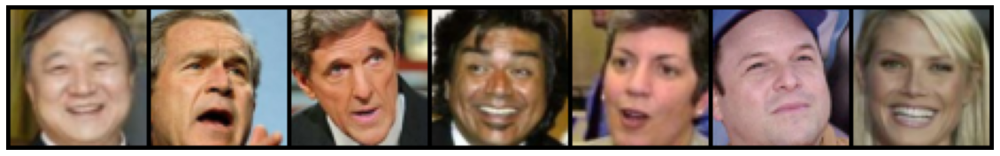

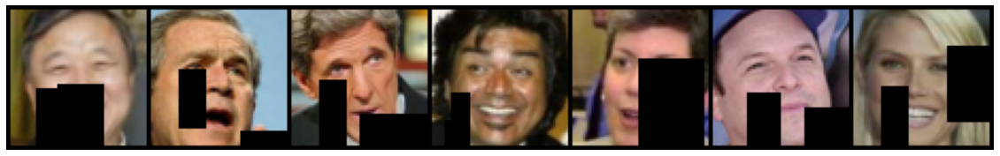

torch.Size([7, 19, 64, 64])


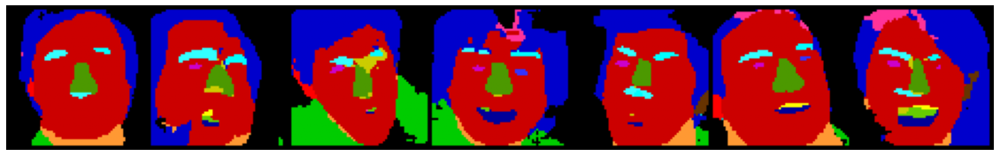

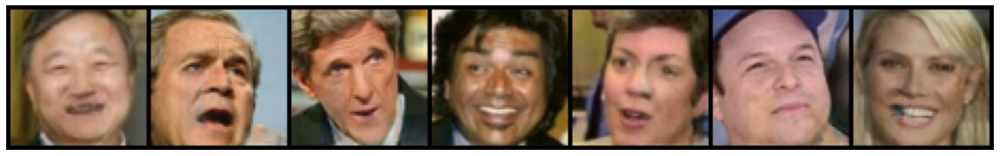

  0%|          | 0/373 [00:00<?, ?it/s]

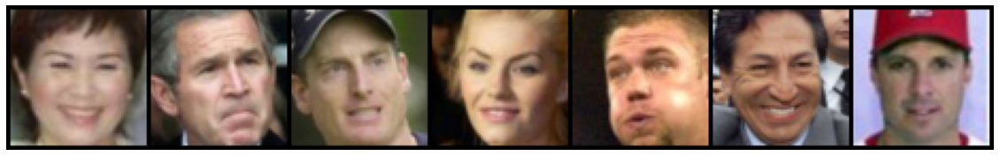

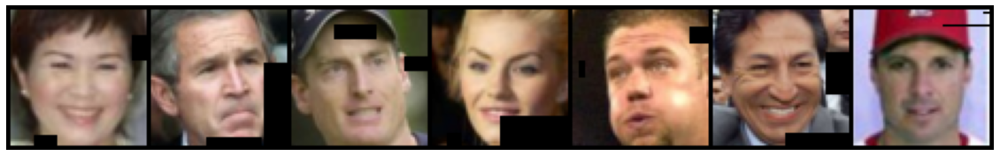

torch.Size([7, 19, 64, 64])


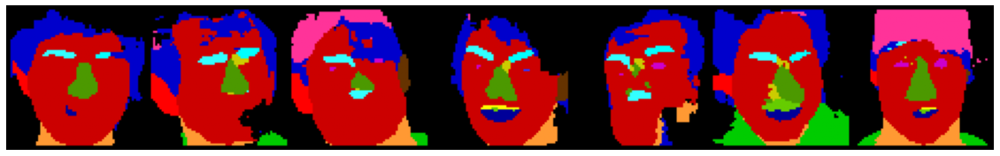

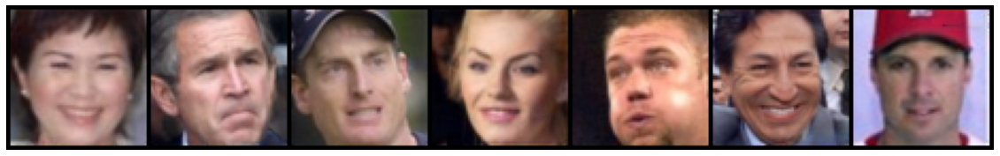

  0%|          | 0/373 [00:00<?, ?it/s]

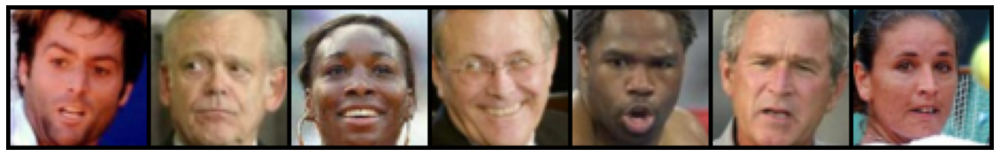

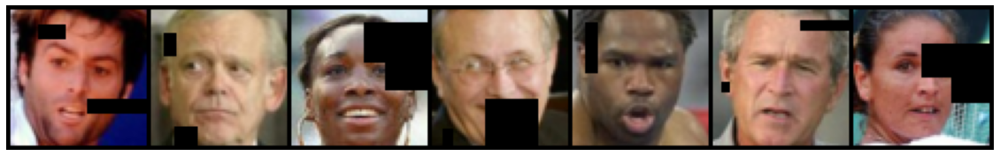

torch.Size([7, 19, 64, 64])


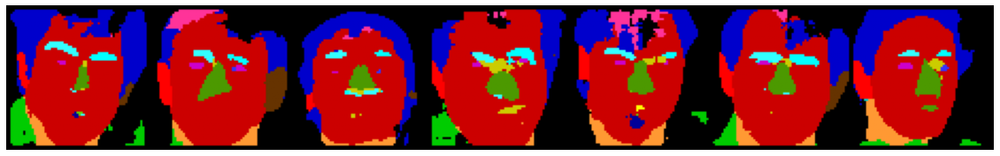

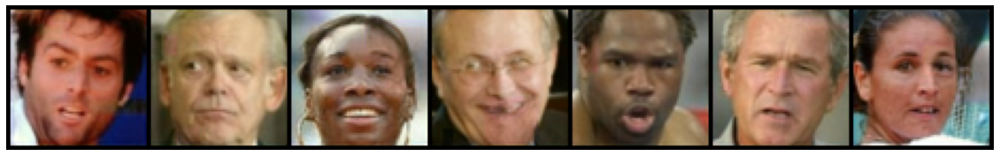

  0%|          | 0/373 [00:00<?, ?it/s]

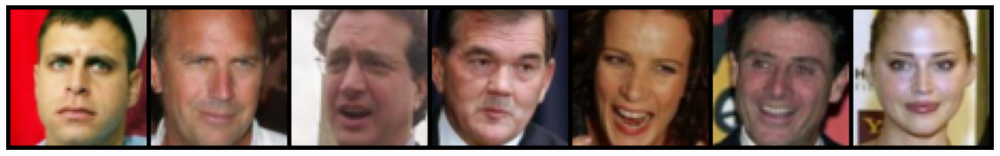

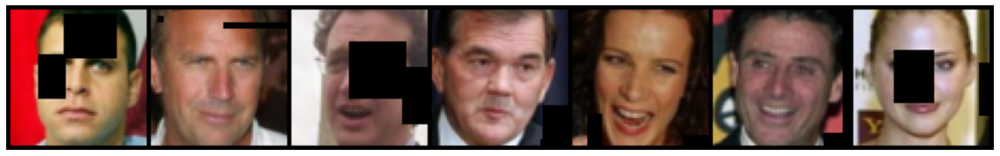

torch.Size([7, 19, 64, 64])


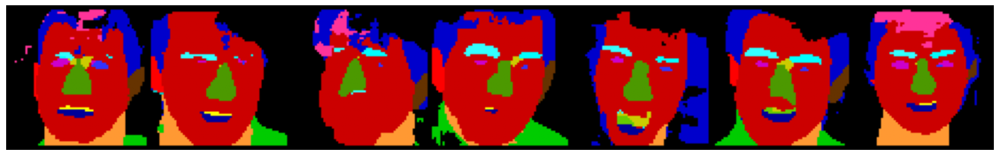

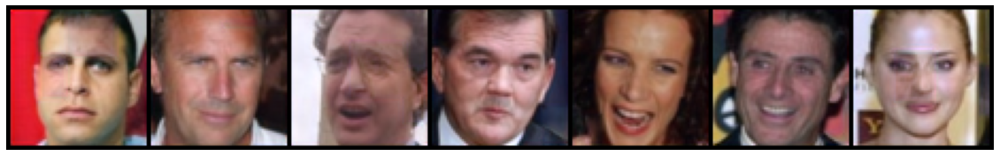

  0%|          | 0/373 [00:00<?, ?it/s]

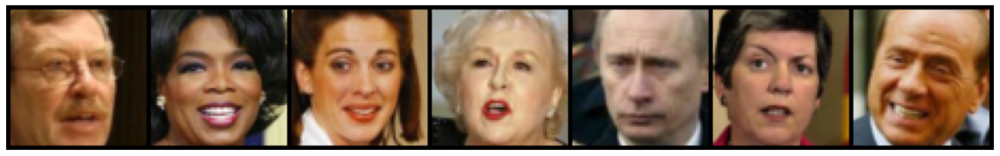

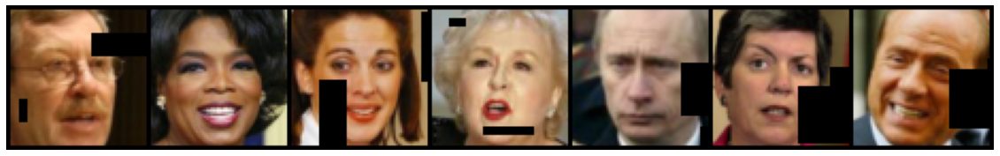

torch.Size([7, 19, 64, 64])


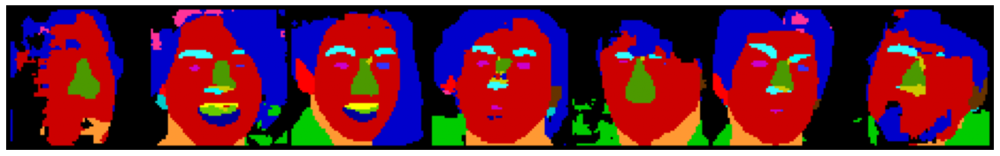

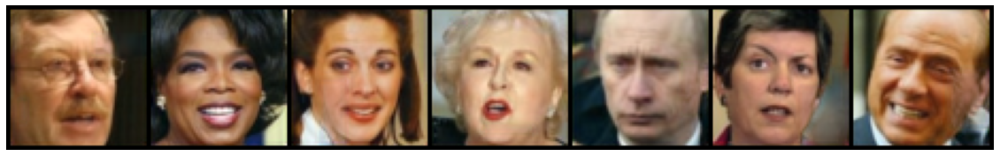

  0%|          | 0/373 [00:00<?, ?it/s]

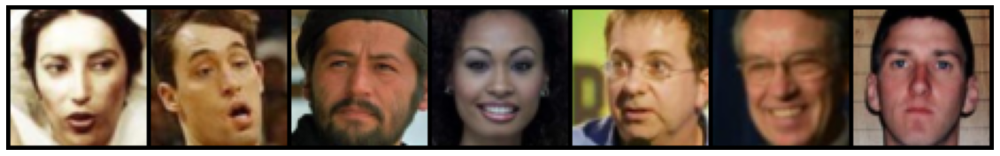

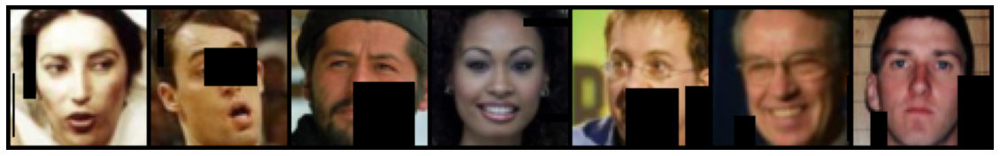

torch.Size([7, 19, 64, 64])


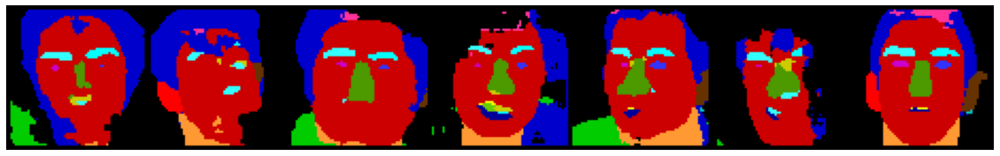

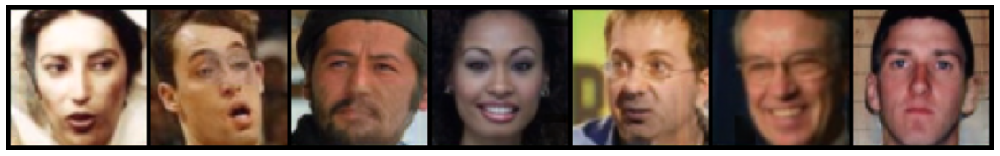

  0%|          | 0/373 [00:00<?, ?it/s]

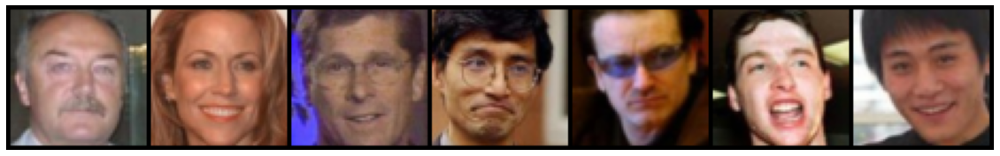

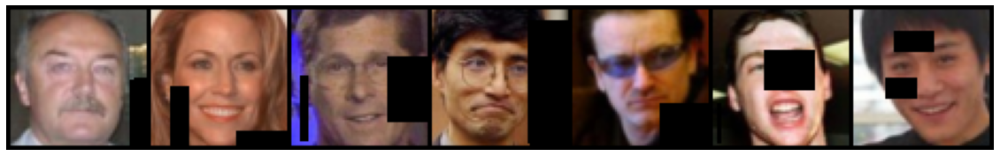

torch.Size([7, 19, 64, 64])


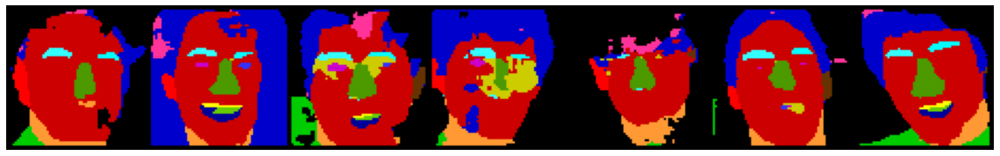

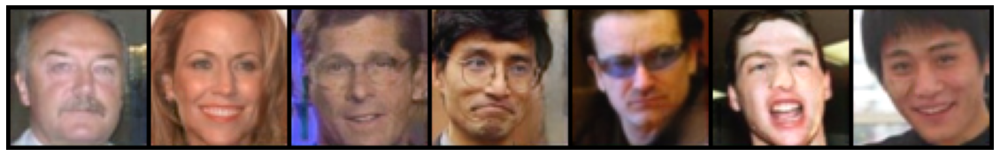

  0%|          | 0/373 [00:00<?, ?it/s]

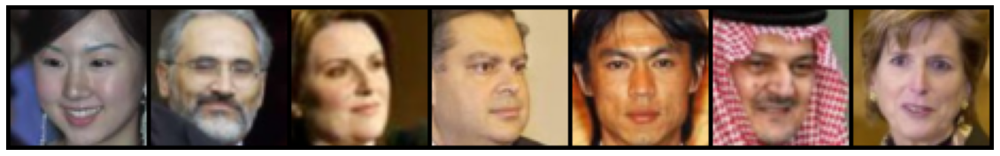

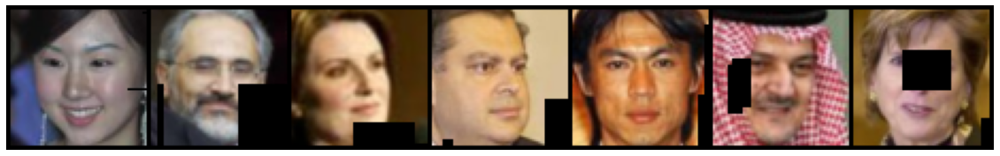

torch.Size([7, 19, 64, 64])


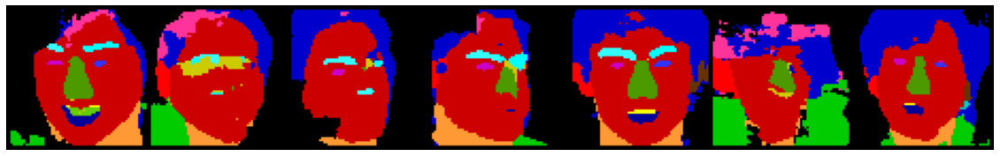

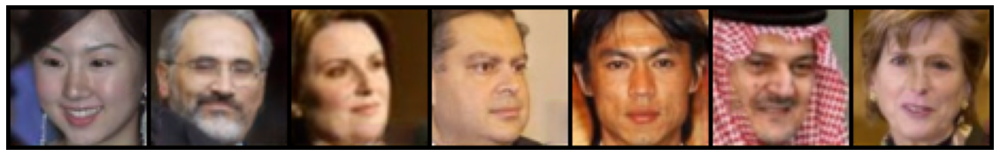

  0%|          | 0/373 [00:00<?, ?it/s]

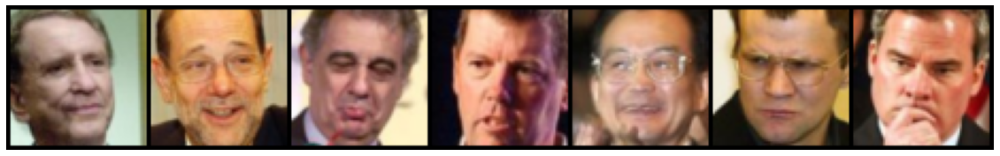

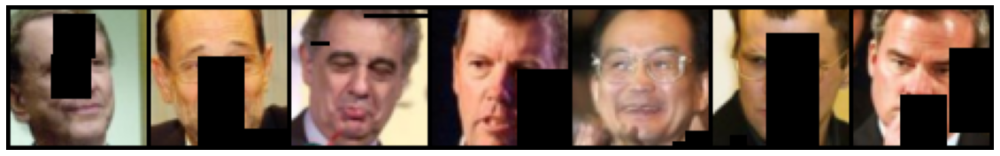

torch.Size([7, 19, 64, 64])


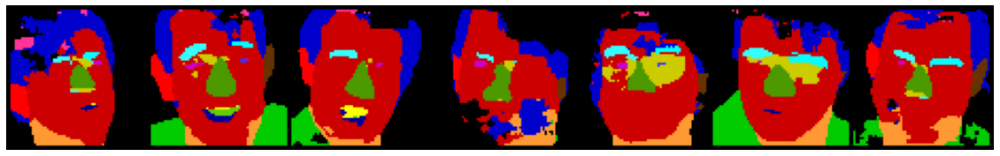

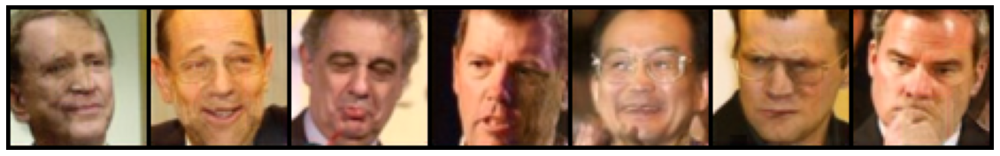

  0%|          | 0/373 [00:00<?, ?it/s]

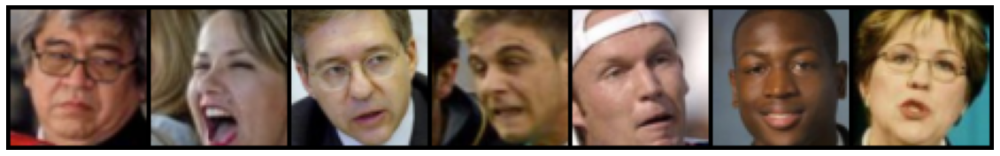

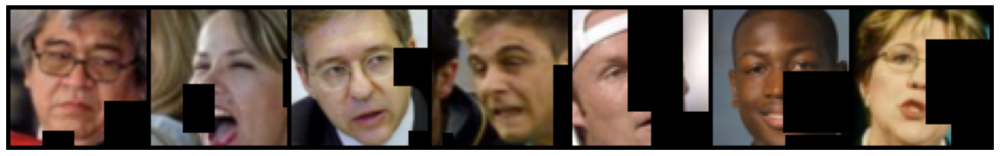

torch.Size([7, 19, 64, 64])


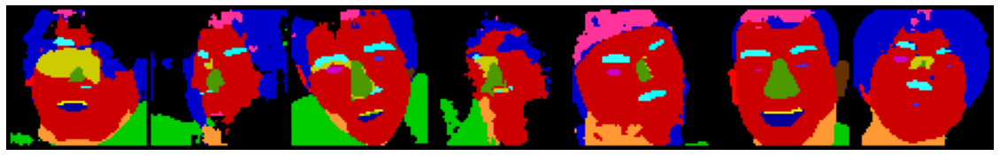

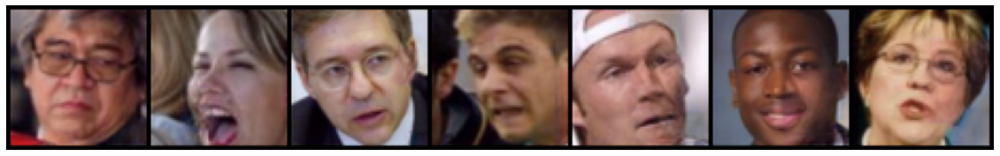

In [9]:
model = imp.model.UNet(22, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
train_inpainting_segmented(model, optimizer, trainloader, simplify_seg=False, epochs=15, min_cut=4, max_cut=60)

torch.save(model.state_dict(), "./modelSave/david/partial22channel_low")

### Test tous les channels

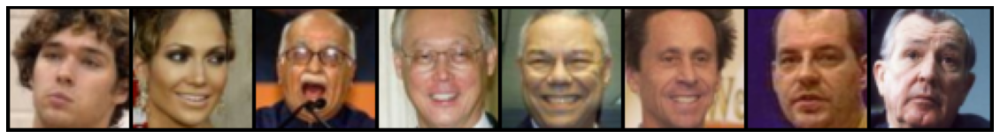

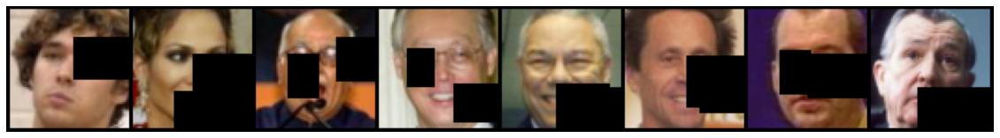

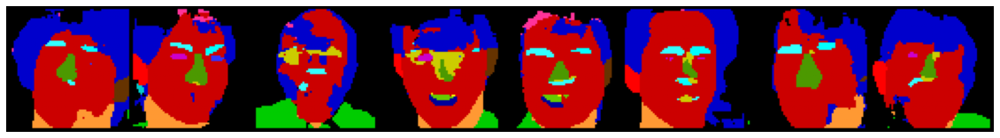

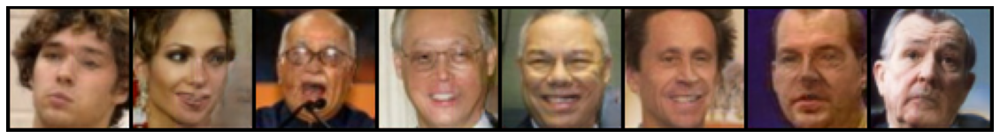

In [14]:
test_results_sample(model, testloader, simplify_seg=False, min_cut=15,max_cut=45)

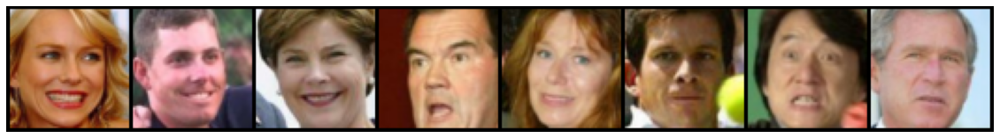

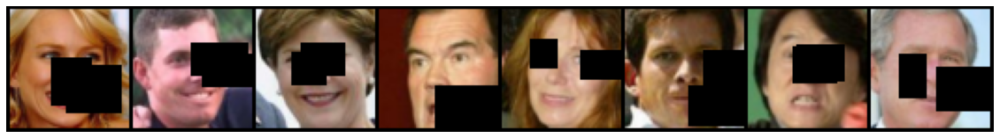

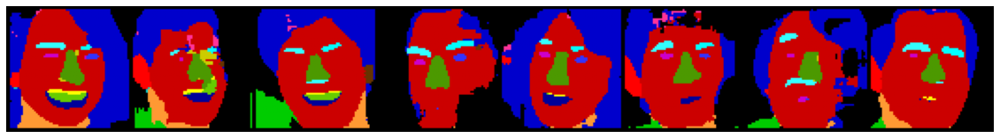

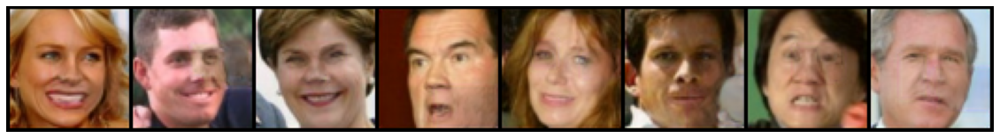

In [16]:
test_results_sample(model, testloader, simplify_seg=False, min_cut=15,max_cut=45)

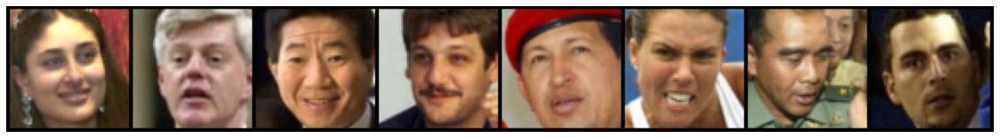

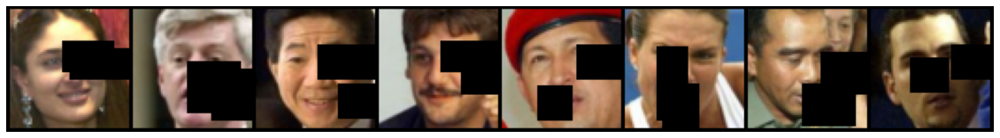

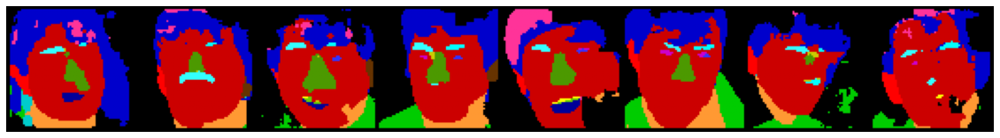

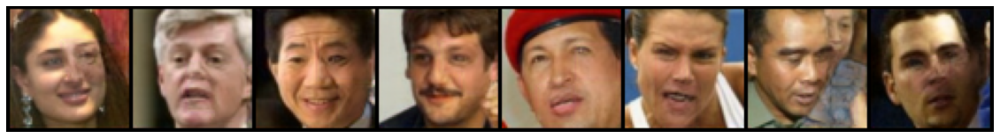

In [25]:
test_results_sample(model, testloader, simplify_seg=False, min_cut=15,max_cut=45)